In [ ]:
# install the input image
!gdown '1FfSpH46ozPWTe1AdTS2NXA_Un8KyZp2z'

Downloading...
From: https://drive.google.com/uc?id=1FfSpH46ozPWTe1AdTS2NXA_Un8KyZp2z
To: /content/cat.jpg
100% 54.3k/54.3k [00:00<00:00, 18.8MB/s]


# Section 1
Read and show the image

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

## Answer 1

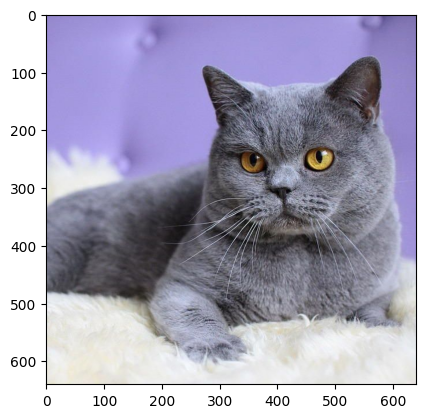

In [ ]:
# Answer your code here
img = cv2.imread('cat.jpg')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

# Section 2
Apply a 3x3 average filter to an input image whose convolution kernel is:

$$
K = \frac{1}{9}
\begin{bmatrix}
1 & 1 & 1  \\
1 & 1 & 1 \\
1 & 1 & 1  \\
\end{bmatrix}
$$

Filter the input image using the function cv.filter2D() and display the results.

## Answer 2

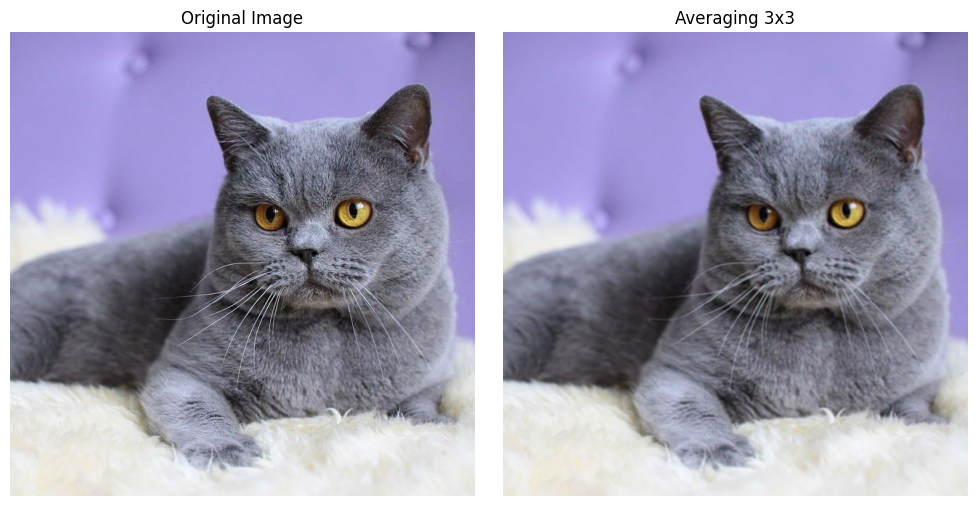

In [ ]:
# Answer your code here
average_kernel = np.ones((3,3),np.float32)/9

output_img = cv2.filter2D(img, -1, average_kernel)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.title('Averaging 3x3')
plt.axis('off')

plt.tight_layout()
plt.show()

# Section 3
- Add Gaussian noise to an image using the provided function add_gaussian_noise().

- Use cv.GaussianBlur() to denoise and adjust the size of the blur kernel (e.g. : (3, 3), (11, 11) etc.) and sigma (e.g., 1, 2, 5 etc). Then observe and explain its influence on the denoising effect.

- Display and compare the following three images (two pairs):

  1. Original image

  2. Image after adding Gaussian noise

  3. Image after applying Gaussian blur

  



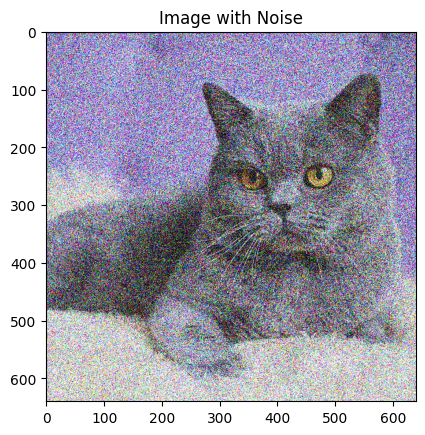

In [ ]:
# Adding gaussian noise
def add_gaussian_noise(image, mean=0, sigma=100):
    noise = np.random.normal(mean, sigma, image.shape) # generate noise
    noisy_image = image + noise #  add noise to the image
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)

noisy_img = add_gaussian_noise(img)

plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB))
plt.title("Image with Noise")
plt.show()

## Answer 3



```
ไทย:
  -ขนาดของ Gaussian blur filter ยิ่งใหญ่ จะทำให้ภาพยิ่งเบลอ
  -sigma คือ standard derivation เมื่อเพิ่มค่า จะทำให้ ภาพ smooth ขึ้น
Eng:
  -The larger the size of the Gaussian blur filter, the more blurred the image becomes.
  -Sigma (σ) is the standard deviation, increasing its value makes the image smoother.
```



In [ ]:
# Answer your code here
def test_Gblur(img,sizes,sigmas):
  for i,k in enumerate(zip(sizes,sigmas)):
    s,z = k
    noise_img = add_gaussian_noise(img)
    blurred_img = cv2.GaussianBlur(noise_img,s,z)
    plt.figure(figsize=(10, 5*len(sigmas)))

    plt.subplot(i+1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(i+1, 3, 2)
    plt.imshow(cv2.cvtColor(noise_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Image with Noise mean:0 sigma:100")
    plt.axis('off')

    plt.subplot(i+1, 3, 3)
    plt.imshow(cv2.cvtColor(blurred_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Gaussian Blurred size:{s} sigma:{z}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

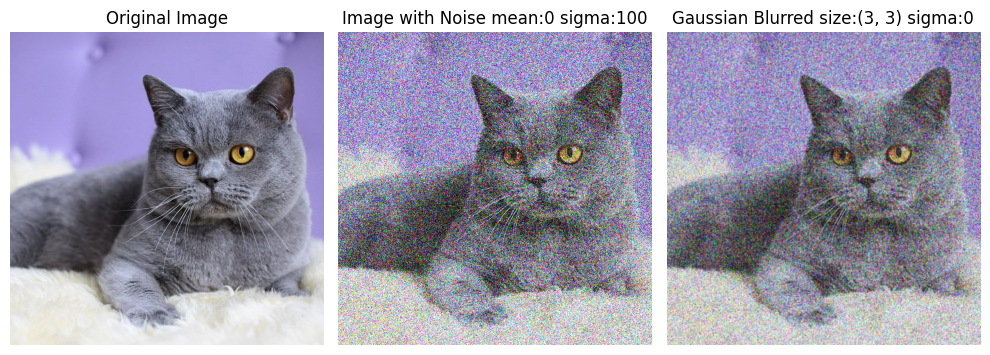

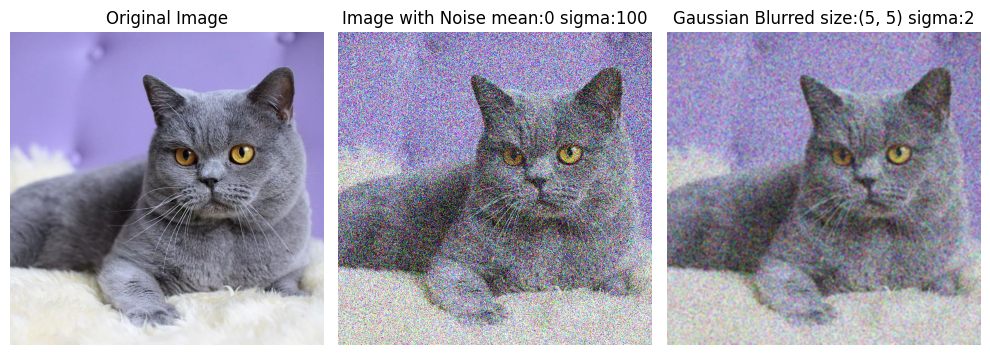

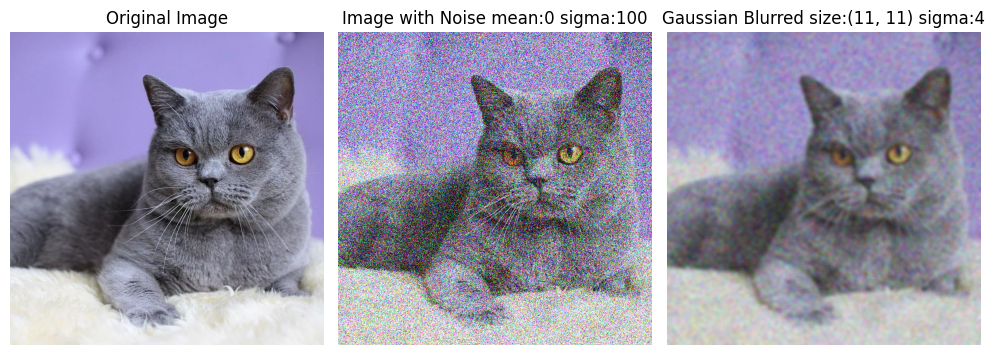

In [ ]:
sizes = [(3,3),(5,5),(11,11)]
sigmas = [0,2,4]

test_Gblur(img, sizes, sigmas)

# Section 4
- Add salt and pepper noise to an image using the provided add_salt_and_pepper_noise() function.
- Adjust the ratio parameters of salt_prob and pepper_prob to observe the effect of noise on the image. (2 different ratio parameters)
- Apply Medianblur (cv2.medianBlur) to the image after adding noise, and adjust the blur kernel size to try to denoise. (2 different kernel size)
- Show and compare the results.

## Answer 4

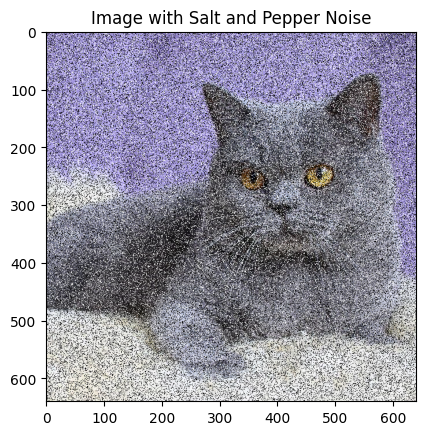

In [ ]:
def add_salt_and_pepper_noise(image, salt_prob=0.02, pepper_prob=0.02):
    noisy_image = image.copy()
    # get image size
    total_pixels = image.size // image.shape[2]
    # calculate the number of noises
    num_salt = int(total_pixels * salt_prob)
    num_pepper = int(total_pixels * pepper_prob)

    # Add salt noises
    for _ in range(num_salt):
        x, y = np.random.randint(0, image.shape[1]), np.random.randint(0, image.shape[0]) # # Generate random coordinates (x, y)
        noisy_image[y, x] = [255, 255, 255] # white

    # Add pepper noises
    for _ in range(num_pepper):
        x, y = np.random.randint(0, image.shape[1]), np.random.randint(0, image.shape[0])
        noisy_image[y, x] = [0, 0, 0]  # black

    return noisy_image

# Add salt-and-pepper noises to the image
salt_and_pepper_noisy_img = add_salt_and_pepper_noise(img, salt_prob=0.2, pepper_prob=0.2)

plt.imshow(cv2.cvtColor(salt_and_pepper_noisy_img, cv2.COLOR_BGR2RGB))
plt.title("Image with Salt and Pepper Noise")
plt.show()

In [ ]:
# Answer your code here
def test_Mblur(img, probs, sizes):
  for i,k in enumerate(zip(probs,sizes)):
    p,s = k
    noise = add_salt_and_pepper_noise(img,p[0],p[1])
    median = cv2.medianBlur(noise,s)

    plt.figure(figsize=(10, 5*len(sigmas)))

    plt.subplot(i+1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(i+1, 3, 2)
    plt.imshow(cv2.cvtColor(noise, cv2.COLOR_BGR2RGB))
    plt.title(f"Image with Noise salt prob:{p[0]} ,pepper prob:{p[1]}")
    plt.axis('off')

    plt.subplot(i+1, 3, 3)
    plt.imshow(cv2.cvtColor(median, cv2.COLOR_BGR2RGB))
    plt.title(f"Median Blurred size:{s}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

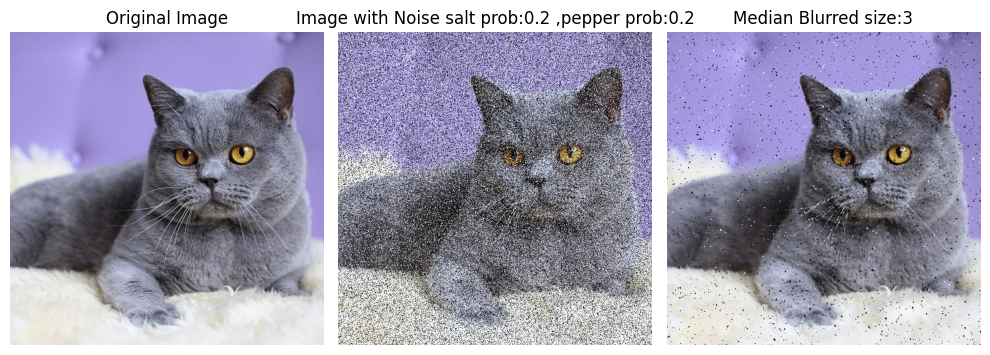

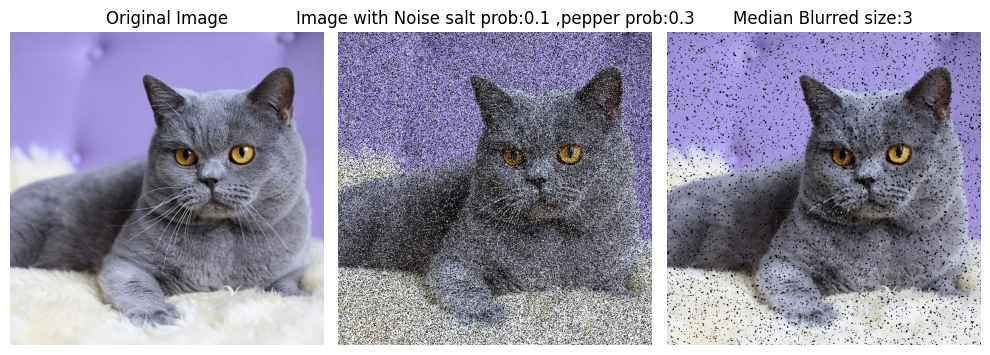

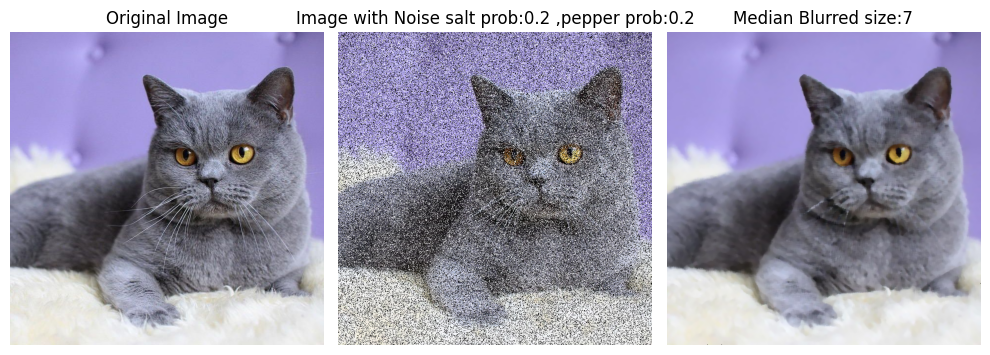

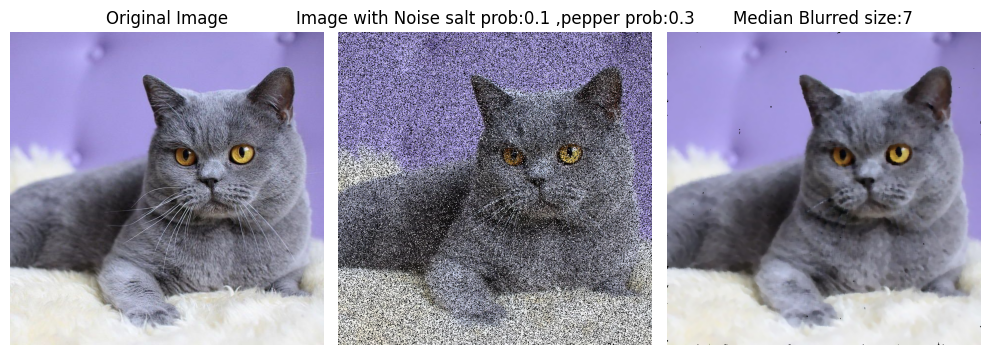

In [ ]:
probs = [(0.2,0.2),(0.1,0.3) ,(0.2,0.2),(0.1,0.3)]
sizes = [3, 3, 7, 7]
test_Mblur(img, probs, sizes)

# Section 5
Fourier Transform

Use the given image "Lenna" to :
1. Perform the Fourier Transform of the input image and display its magnitude spectrum.

2. Implement the Low-Pass Filter (LPF) using NumPy and the High-Pass Filter (HPF) using OpenCV. Apply both filters to the same input image and compare the output results.

3. Compare how LPF and HPF affect the image. Explain how they influence image sharpness, edges, details, and smoothness.

4. Modify the mask size to 10, 30, 100.
Observe and explain the resulting three types of filtered images for different mask sizes.


In [ ]:
!gdown '1FNXTuv3OcIg-6o8D9XlhVHhMHGiuAQLA'

Downloading...
From: https://drive.google.com/uc?id=1FNXTuv3OcIg-6o8D9XlhVHhMHGiuAQLA
To: /content/Lenna.png
100% 194k/194k [00:00<00:00, 6.57MB/s]


## Answer 5.1

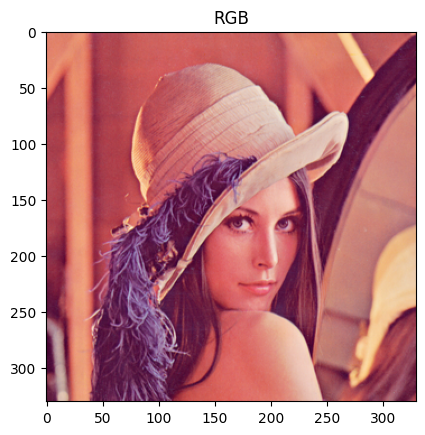

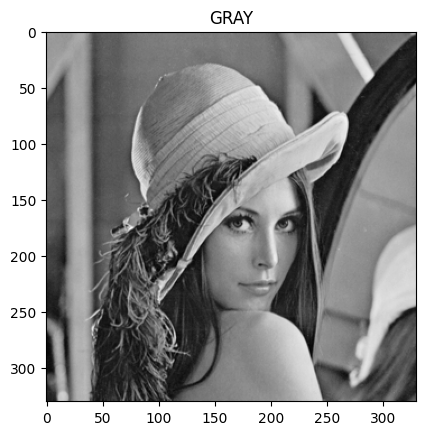

In [ ]:
# Answer your code here
# Read the image as grayscale and display.
img = cv2.imread('Lenna.png')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#plot image
plt.title('RGB')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.show()

plt.title('GRAY')
plt.imshow(img_gray,cmap='gray')
plt.show()


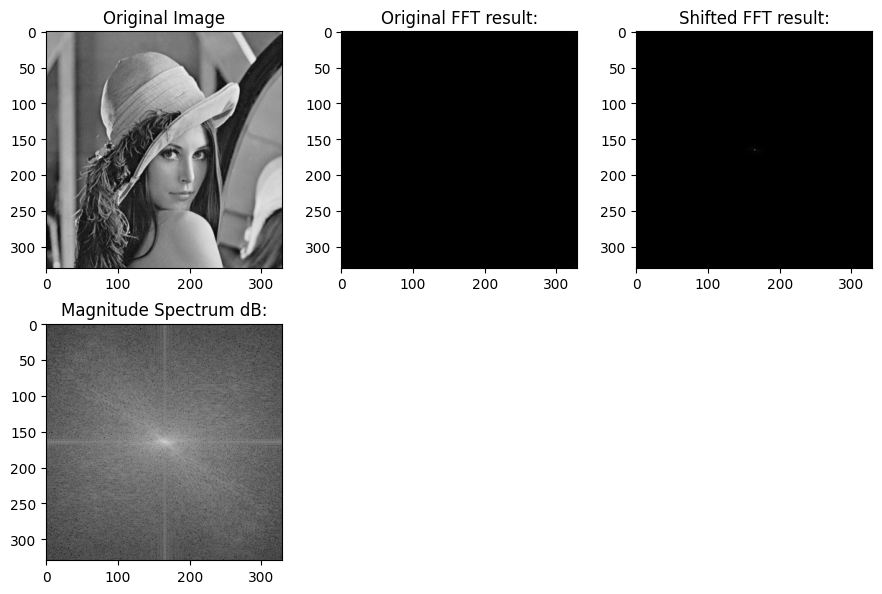

In [ ]:
# Answer your code here
plt.figure(figsize=(9, 6))

plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 3, 2)
fft_img = (np.fft.fft2(img_gray))
plt.imshow(np.abs(fft_img), cmap='gray')
plt.title('Original FFT result:')

plt.subplot(2, 3, 3)
fshift_img = np.fft.fftshift(fft_img)
plt.imshow(np.abs(fshift_img), cmap='gray')
plt.title('Shifted FFT result:')

plt.subplot(2, 3, 4)
magnitude_spectrum = 20*np.log(np.abs(fshift_img)+1)  # Add 1 to avoid log(0) Magnitude in dB=20⋅log(Amplitude)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum dB:')

plt.tight_layout()
plt.show()




## Answer 5.2

################################################
row=330, col=330
Center coordinates: crow=165, ccol=165
Hole Row range: 105 to 226
Hole Column range: 105 to 226
################################################


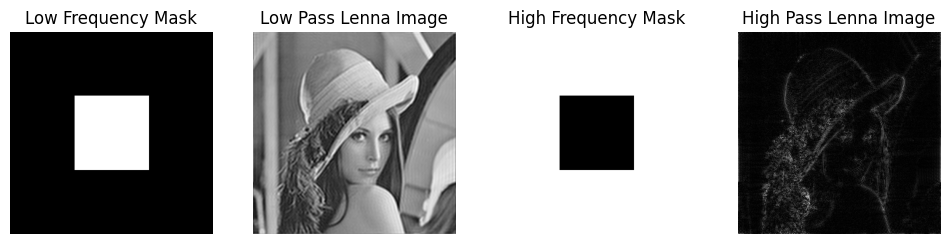

<Figure size 640x480 with 0 Axes>

In [ ]:
rows, cols = img_gray.shape
mask = np.ones((rows, cols), np.uint8)
mask_high = np.ones((rows, cols, 2), np.uint8)

crows, ccols = rows // 2, cols // 2

print('################################################')
print(f'row={rows}, col={cols}')
print(f"Center coordinates: crow={crows}, ccol={ccols}")
print(f"Hole Row range: {crows-60} to {crows+61}")
print(f"Hole Column range: {ccols-60} to {ccols+61}")
print('################################################')

plt.figure(figsize=(12,6))

# Low Frequency Mask (0:black,1:white)
mask[:crows-60,:] = 0
mask[crows+61:,:] = 0
mask[crows-60:crows+61, :ccols-60] = 0
mask[crows-60:crows+61, ccols+61:] = 0

plt.subplot(1, 4, 1)
plt.imshow(mask,cmap='gray')
plt.title('Low Frequency Mask')
plt.axis('off')

# Lenna Low Frequency
low_img = fshift_img.copy()
high_img = fshift_img.copy()

low_img[:crows-60,:] = 0
low_img[crows+61:,:] = 0
low_img[crows-60:crows+61, :ccols-60] = 0
low_img[crows-60:crows+61, ccols+61:] = 0
f_ishift_low_img = np.fft.ifftshift(low_img)
img_low_back = np.fft.ifft2(f_ishift_low_img)
img_low_back = np.real(img_low_back)

plt.subplot(1, 4, 2)
plt.imshow(img_low_back, cmap='gray')
plt.title('Low Pass Lenna Image')
plt.axis('off')

# High Frequency Mask
mask_high[crows-60:crows+61, ccols-60:ccols+61] = 0
plt.subplot(1, 4, 3)
plt.imshow(mask_high[:,:,0], cmap='gray')
plt.title('High Frequency Mask')
plt.axis('off')

# Lenna High Frequency
dft = cv2.dft(np.float32(img_gray), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
fshift_hi_img = dft_shift * mask_high
f_ishift_hi_img = np.fft.ifftshift(fshift_hi_img)
img_hi_back = cv2.idft(f_ishift_hi_img)
img_hi_back = cv2.magnitude(img_hi_back[:, :, 0], img_hi_back[:, :, 1])
plt.subplot(1, 4, 4)
plt.imshow(img_hi_back, cmap='gray')
plt.title('High Pass Lenna Image')
plt.axis('off')

plt.show()
plt.tight_layout()



## Answer 5.3

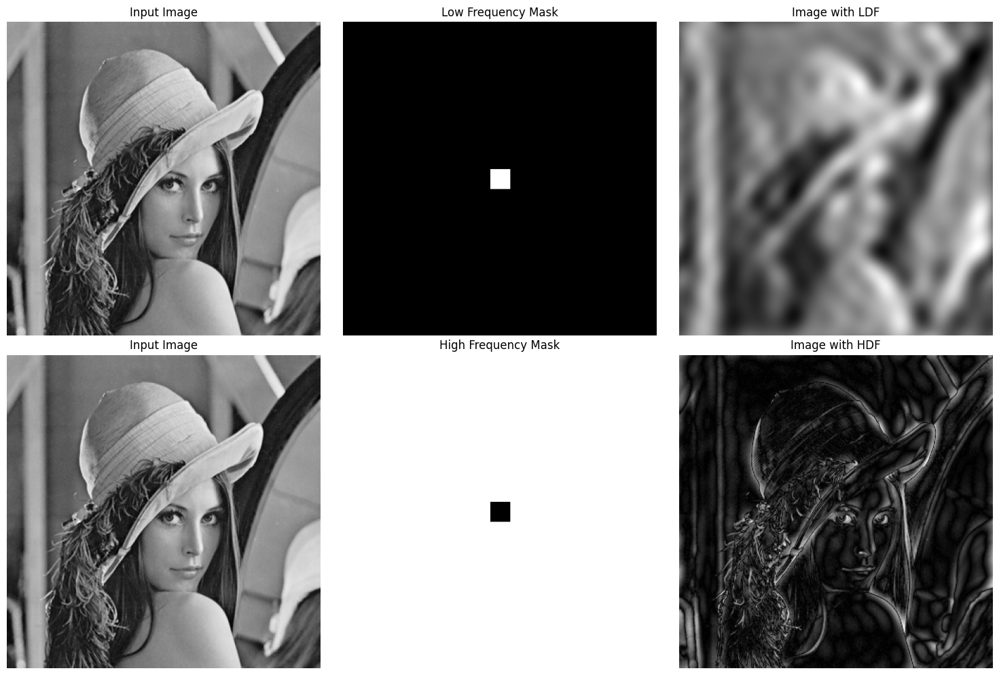

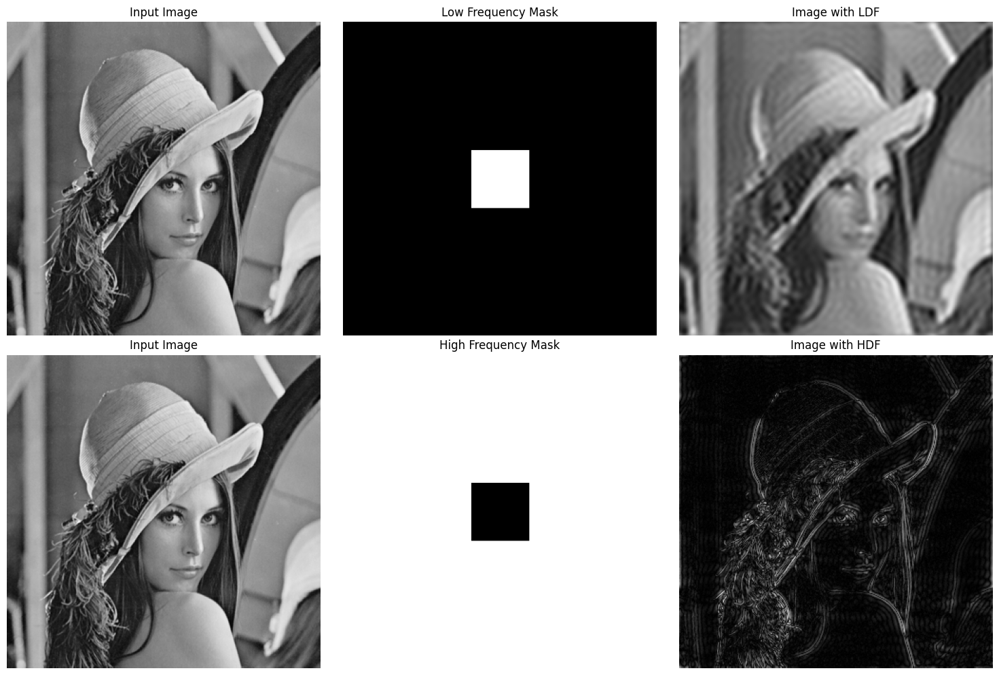

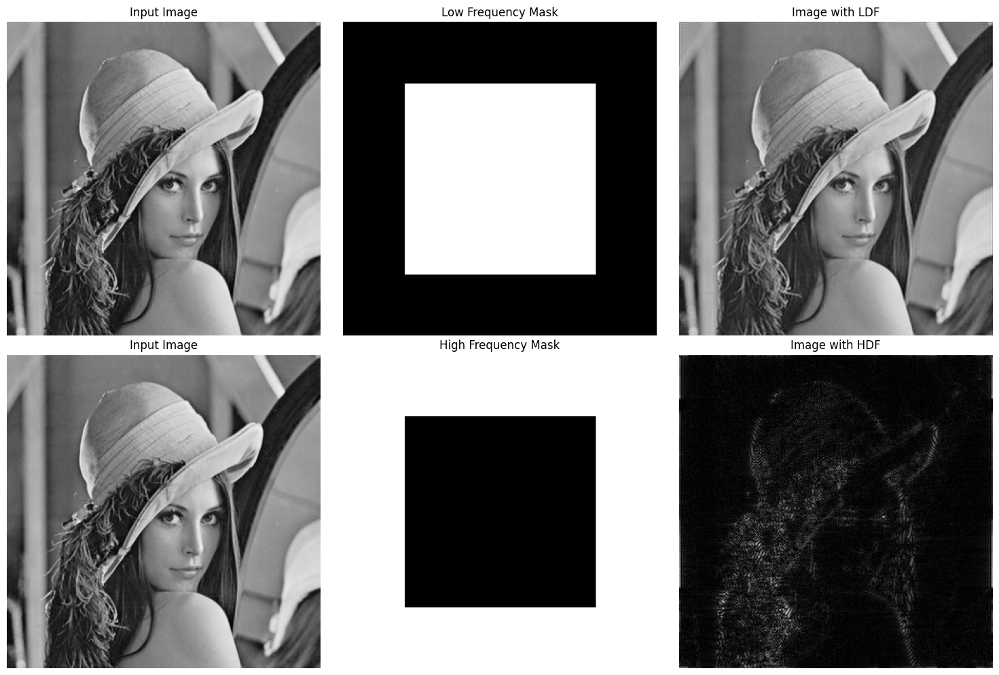

In [ ]:
def low_hi_pass_test(img, sizes):
  for size in sizes:
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2

    mask = np.zeros((rows, cols, 2), np.uint8)
    mask_low, mask_hi = mask.copy(), mask.copy()

    mask_low[crow-size:crow+size+1, ccol-size:ccol+size+1] = 1

    mask_hi[:crows-size,:] = 1
    mask_hi[crows+size+1:,:] = 1
    mask_hi[crows-size:crows+size+1, :ccols-size] = 1
    mask_hi[crows-size:crows+size+1, ccols+size+1:] = 1


    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    fshift_lowpass = dft_shift * mask_low
    fshift_hipass = dft_shift * mask_hi

    f_ishift_hi = np.fft.ifftshift(fshift_hipass)
    f_ishift_low = np.fft.ifftshift(fshift_lowpass)

    img_back_hi = cv2.idft(f_ishift_hi)
    img_back_low = cv2.idft(f_ishift_low)

    img_back_hi = cv2.magnitude(img_back_hi[:, :, 0], img_back_hi[:, :, 1])
    img_back_low = cv2.magnitude(img_back_low[:, :, 0], img_back_low[:, :, 1])

    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Input Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(mask_low[:, :, 0], cmap='gray')
    plt.title('Low Frequency Mask')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(img_back_low, cmap='gray')
    plt.title('Image with LDF')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(img, cmap='gray')
    plt.title('Input Image')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(mask_hi[:, :, 0], cmap='gray')
    plt.title('High Frequency Mask')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(img_back_hi, cmap='gray')
    plt.title('Image with HDF')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


sizes = [10, 30, 100]
img = cv2.imread('Lenna.png')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
low_hi_pass_test(img_gray, sizes)

## Explain



```
ไทย:
เมื่อ ขนาด center เพิ่มขึ้น
  -Low pass จะกรองข้อมูลที่ให้ความถี่ต่ำมากขึ้น ภาพที่ได้จะดูแทบไม่แตกต่างจากภาพเดิมเลย หากใช้ ขนาด center ใหญ่พอ
  -High pass จะกรองข้อมูลได้น้อยลง จนไม่สามารถ หา เส้นขอบในภาพได้
เมื่อ ขนาด center ลดลง
  -Low pass จะกรองข้อมูลน้อยลง ทำให้ภาพที่ได้มีความเบลอ
  -High pass จะกรองข้อมูลได้มากขึ้น ทำให้ได้ขอบมากขึ้นซึ่ง หาก ขนาด center เล็กเกินก็อาจทำให้ได้ข้อมูลขอบที่ไม่จำเป็นมาด้วย

Eng:
when increase size of center:
  -Low-pass term's filtering is increase a number of low frequency image's feature make it's look same.
  -High-pass term's filtering is decrease a number of high frequency image's feature make it's look blur in egde detection
when decrease size of center:
  -Low-pass term's filtering is decrease a number of low frequency image's feature make it's look blur.
  -High-pass term's filtering is increase a number of high frequency image's feature,
  make it's have more egde but avoid to fiter is small too much will make a lot of edge.
```

